In [16]:
from draw_random_maps import *
from load_state_data import *

In [17]:
def plot_redblue_notebook(df, dcol="G20PREDBID", rcol="G20PRERTRU", num_dists=14):
    '''
    Plot a map that color-codes each precinct by the partisan margin of the vote
    in the district it's part of, i.e. dark blue if it largely voted Democratic,
    dark red if it overwhelmingly voted Republican, and white if it was close to even.

    Inputs:
        -df (geopandas DataFrame): state data by precincts/VTDs, with polygons
        -dcol (str): Name of column that contains Democratic voteshare data
        (i.e. estimated number of votes cast for Joe Biden in the precinct in
        the November 2020 presidential election)
        -rcol (str): Name of the column that contains Republican voteshare data
        (i.e. estimated number of votes cast for Donald Trump in the precinct
        in the November 2020 presidnetial election)
        -num_dists (int):
        -export_to (str or None): TODO: location to export the map to

    Returns: None, displays plot on screen and/or saves image to file
    '''
    
    #TODO: Move this to df setup, and have it be by precinct, with dissolve aggfunc-ing it 
    df['raw_margin'] = None
    for i in range(1, num_dists+1): #this should be doable on one line vectorized
        df.loc[df.dist_id == i, 'raw_margin'] = blue_red_margin(df, dcol, rcol, i)

    #TODO: figure out how to push legend off map, or maybe turn it into categorical color bar
    df.plot(column='raw_margin', cmap='seismic_r')
    #fig, ax = plt.subplots(1)
    #sm = plt.cm.ScalarMappable(cmap='seismic_r')
    #cbar = fig.colorbar(sm) #all of these extremely basic things from many matplotlib StackOverflow answers fail

    plt.pyplot.show()

In [18]:
def load_state(state_input, init_neighbors=False, affix_neighbors=True):
    '''
    Helper function that actually imports the state after selecting it.

    Inputs:
        -state_input (str): 2-letter state postal code abbreviation
    Returns (geopandas GeoDataFrame)
    '''
    state_fullname = [k for k, v in SUPPORTED_STATES.items() if v == state_input][0] #DRY

    print(f"Importing {state_fullname} 2020 Redistricting Data Hub data...")
    fp = f"merged_shps/{state_input}_VTD_merged.shp"
    state_data = gpd.read_file(fp)
    if "Tot_2020_t" in state_data.columns:
        state_data.rename(columns={"Tot_2020_t","POP100"})
        print("Renamed population column to POP100")
    print(f"{state_input} 2020 Redistricting Data Hub shapefile data imported")
    if init_neighbors:
        set_precinct_neighbors(state_data, state_input)
        print("Precinct neighbors calculated")
    if affix_neighbors: #maybe figure out how to do these as command line flags
        neighbor_fp = f'merged_shps/{state_input}_2020_neighbors.csv'
        affix_neighbors_list(state_data, neighbor_fp)
        print("Neighbors list affixed from file")
    state_data['dist_id'] = None

    return state_data   


In [28]:
df = load_state('GA')

Importing Georgia 2020 Redistricting Data Hub data...
GA 2020 Redistricting Data Hub shapefile data imported
Neighbors list affixed from file


In [29]:
draw_dart_throw_map(df, num_districts = 14)

Clearing off previous district drawings, if any...
Throwing dart for district 1 at precinct 13123000008...
Throwing dart for district 2 at precinct 1314100004A...
Throwing dart for district 3 at precinct 13127005913...
Throwing dart for district 4 at precinct 131210005A2...
Throwing dart for district 5 at precinct 13285000003...
Throwing dart for district 6 at precinct 13245000707...
Throwing dart for district 7 at precinct 1312100SS01...
Throwing dart for district 8 at precinct 1329900200B...
Throwing dart for district 9 at precinct 1305900006D...
Throwing dart for district 10 at precinct 1306700DC01...
Throwing dart for district 11 at precinct 1331500005A...
Throwing dart for district 12 at precinct 1312100007H...
Throwing dart for district 13 at precinct 13217000004...
Throwing dart for district 14 at precinct 13215000118...
2684 unfilled precincts remain


ValueError: can only convert an array of size 1 to a Python scalar

c:\Users\Ethan\anaconda3\lib\site-packages\pandas\core\algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


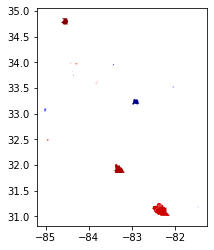

In [23]:
plot_redblue_notebook(df, dcol="G20PREDBID", rcol="G20PRERTRU", num_dists=14)

In [183]:
df_district_pop = df.dissolve(by = 'dist_id', aggfunc = sum)[['Tot_2020_c', 'geometry']].reset_index()

In [187]:
df_district_pop

,dist_id,Tot_2020_c,geometry
11,12,30757,"POLYGON ((-82.04280 33.38417, -82.04267 33.384..."
13,14,208082,"POLYGON ((-85.08825 31.37151, -85.08763 31.372..."
10,11,407106,"MULTIPOLYGON (((-85.26866 34.14679, -85.26872 ..."
8,9,483131,"MULTIPOLYGON (((-84.58118 33.63743, -84.57845 ..."
12,13,511386,"MULTIPOLYGON (((-84.66028 34.00897, -84.66026 ..."
4,5,576646,"MULTIPOLYGON (((-83.34881 32.27060, -83.34689 ..."
1,2,590249,"MULTIPOLYGON (((-84.91359 33.64242, -84.91357 ..."
5,6,605103,"POLYGON ((-84.30009 33.93579, -84.30056 33.935..."
9,10,620366,"MULTIPOLYGON (((-84.08447 30.67583, -84.09267 ..."
6,7,656923,"MULTIPOLYGON (((-84.51836 33.10655, -84.51838 ..."


In [188]:
while (df_district_pop.Tot_2020_c.max() - df_district_pop.Tot_2020_c.min()) > 70000:
    df_district_pop = df.dissolve(by = 'dist_id', aggfunc =sum)[['Tot_2020_c', 'geometry']].reset_index()
    df_district_pop = df_district_pop.sort_values("Tot_2020_c").reset_index()
    needs_pop = df_district_pop.iloc[1,:]
    print(needs_pop['dist_id'])

    gpd.centroid

    neighbors = np.array(df_district_pop[df_district_pop.geometry.touches(needs_pop.geometry)].dist_id)

    neighbor_pop_dict = {}
    for i in neighbors:
        pop = df_district_pop[df_district_pop.dist_id == i]["Tot_2020_c"].iloc[0]
        neighbor_pop_dict[i] = pop

    max = 0
    comp_district = None

    for k,v in neighbor_pop_dict.items():
        diff = abs(needs_pop.Tot_2020_c - v)
        if diff > max:
            comp_district = k
            max = diff

    print(comp_district)

    border = needs_pop.geometry.intersection(
        df_district_pop[df_district_pop.dist_id == comp_district].geometry.iloc[0])

    giving_tradable = df[df.dist_id == comp_district]
    giving_border = giving_tradable[giving_tradable.geometry.intersects(border)]

    moving_district = giving_border[giving_border["Tot_2020_c"] == giving_border.Tot_2020_c.max()]
    df.loc[df['GEOID20'] == moving_district['GEOID20'].iloc[0], 'dist_id'] = needs_pop.dist_id
    print(df_district_pop.Tot_2020_c.max() - df_district_pop.Tot_2020_c.min())

14
3
694990
14
3
690680
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
1
689956
14
3
689956
14
3
689956
14
3
689956
14
3
689956
14
1
689956
14
3
689956
14
3
689956
14
1
689956
14
1
689956
14
3
689956
14
4
689956
14
1
689956
14
1
689956
14
3
689956
14
1
689956
14
7
689956
14
1
689956
14
4
689956


KeyboardInterrupt: 

In [189]:
df_district_pop

,index,dist_id,Tot_2020_c,geometry
0,11,12,30757,"POLYGON ((-82.04280 33.38417, -82.04267 33.384..."
1,13,14,316543,"MULTIPOLYGON (((-85.05819 31.58664, -85.05803 ..."
2,10,11,407106,"MULTIPOLYGON (((-85.26866 34.14679, -85.26872 ..."
3,8,9,483131,"MULTIPOLYGON (((-84.58118 33.63743, -84.57845 ..."
4,12,13,511386,"MULTIPOLYGON (((-84.66028 34.00897, -84.66026 ..."
5,4,5,576646,"MULTIPOLYGON (((-83.34881 32.27060, -83.34689 ..."
6,1,2,590249,"MULTIPOLYGON (((-84.91359 33.64242, -84.91357 ..."
7,5,6,605103,"POLYGON ((-84.30009 33.93579, -84.30056 33.935..."
8,9,10,620366,"MULTIPOLYGON (((-84.08447 30.67583, -84.09267 ..."
9,6,7,653834,"MULTIPOLYGON (((-84.51836 33.10655, -84.51838 ..."


In [129]:
df[df.GEOID20 == '13215000103']

,GEOID20,Tot_2010_t,Wh_2010_to,His_2010_t,BlC_2010_t,NatC_2010_,AsnC_2010_,PacC_2010_,Tot_2010_v,Wh_2010_va,...,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry,neighbors,dist_id,raw_margin
477,13215000103,6919,729,214,5967,42,92,35,5260,644,...,G5240,N,6316055,1409,+32.4563360,-084.9115840,"POLYGON ((-84.92930 32.46228, -84.92906 32.462...","[13215000113, 13215000102, 13215000116, 132150...",14,-0.12418


In [128]:
test_one

dist_id                                                      14
geometry      POLYGON ((-85.032198 31.341388, -85.0319459999...
Tot_2020_c                                                43079
neighbors                                               [3, 10]
Name: 13, dtype: object

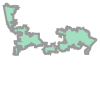

In [136]:
df_district_pop[df_district_pop.dist_id == comp_district].geometry.iloc[0]

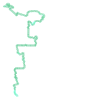

In [137]:
border

In [85]:
import folium

In [138]:
m = folium.Map()

folium.Choropleth(
     geo_data = df_district_pop.geometry,

).add_to(m)

In [139]:
m